# В данном ноутбуке рассматривается пример нейронной передачи стиля

Суть нейронной передачи стиля заключатеся в том, что сеть запоминает стиль исходного изображения, а также его содержимое, и применяет для другого изображения.

Стиль - цвет, текстура, визуальные шаблоны

Содержимое - дома, люди, растения и прочие объекты

Понятно, что необходимо определить функцию потерь. Она должна сводить разницу между стилем исходной картинки, ее содержимыми и содержимым и стилем сгенерированной картинки к минимуму. Значит, надо определить еще две функции потерь: для стиля и для содержимого.

Функция потерь содержимого - L2 норма между активацией верхнего слоя предобученной сети, вычисленной по целевому изображению и активацией верхнего слоя, вычисленной по сгенерированному изображению. Верхние слои сети видят более абстрактные объекты на изображении, поэтому их и используем.

Функция потери стиля - матрицы Грама активаций ВСЕХ слоев сети. Матрица Грама - произведение карт признаков каждого слоя. Это можно интерпретировать, как матрицу корреляций между признаками слоя.


Весь процесс в общих чертах:
* Создание сети, которая вычисляет активации слоя VGG19 для трех изображений: образца, целевого и сгенерированного
* Полученные активации используются для создания общей функции потерь, состоящей из двух: потери стиля и содержимого
* Градиентное восхождение для минимализации функции потерь

# Определение начальных переменных

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
import tensorflow as tf

tf.compat.v1.disable_eager_execution()
# фото, с которого берется содержимое
target_image_path = '/content/drive/MyDrive/StudyingKeras/Deep Style/input/starry_night.jpg'
# фото, с которого берется стиль
style_reference_image_path = '/content/drive/MyDrive/StudyingKeras/Deep Style/input/paint.jpg'

# огрничиваем размеры входного изображения
width, height = load_img(target_image_path).size
img_height = 400
img_width = int(width * img_height / height)

Вспомогательные функции

In [ ]:
import numpy as np
from keras.applications import vgg19

def preprocess_image(image_path):
  img = load_img(image_path, target_size=(img_height, img_width))
  img = img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = vgg19.preprocess_input(img)
  return img

def deprocess_image(x):
  # удаление среднего значения пиксела из ImageNet
  # это отменяет изменения, сделанные в img = vgg19.preprocess_input(img)
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  # конвертация из BGR в RGB - тоже отмена преобразования img = vgg19.preprocess_input(img)
  x = x[:, :, ::-1]
  x = np.clip(x, 0, 255).astype('uint8')
  return x

# Загрузка предобученной VGG19 и применение ее к трем изображениям

In [ ]:
from keras import backend as K

# фото-образец и целевое фото - не изменяются
target_image = K.constant(preprocess_image(target_image_path))
style_reference_image = K.constant(preprocess_image(style_reference_image_path))
combination_image = K.placeholder((1, img_height, img_width, 3))

# объединение трех тензоров в один
input_tensor = K.concatenate([target_image, style_reference_image, combination_image], axis=0)

model = vgg19.VGG19(input_tensor=input_tensor, weights='imagenet', include_top=False)

# Функция потерь содержимого

In [ ]:
def content_loss(base, combination):
  # ТАК ВЫЧИСЛЯЕТСЯ L2-норма
  return K.sum(K.square(combination - base))


# Функция потерь стиля

In [ ]:
# вспомогательная функция - вычисление матрицы Грэма
def gram_matrix(x):
  # permute_dimensions - меняет местами оси
  # batch_flatten - превращает Nмерный тензор в 2мерный
  features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
  # dot - перемножает два тензора и возвращает тензор
  gram = K.dot(features, K.transpose(features))
  return gram

def style_loss(style, combination):
  S = gram_matrix(style)
  C = gram_matrix(combination)
  channels = 3
  size = img_width * img_height
  # хз что это...
  return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size  ** 2))


# Функция общей потери вариации

Она позволяет избежать мозаичного эффетка на изображении. Ее можно интерпретировать как регуляризацию потерь

In [ ]:
def total_variation_loss(x):
  a = K.square(
      x[:, :img_height - 1, :img_width - 1, :] - 
      x[:, 1, :img_width - 1, :]
  )
  b = K.square(
      x[:, :img_height - 1, :img_width - 1, :] - 
      x[:, :img_height - 1, 1:, :]
  )
  return K.sum(K.pow(a + b, 1.25))

Функция потерь, которую мы хотим минимизировать возвращает среднее взвешенно этих трех компонент

# Общая функция потерь

In [ ]:
# словарь: имя слоя - активация слоя
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
# слой, отвечающий за потери содержимого (верхний)
content_layer = 'block5_conv2'
# слои, отвечающие за потери стиля (все)
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1','block4_conv1', 'block5_conv1']

# веса для вычисления среднего взвешенного по трем компонентам потерь
total_variation_weight = 1e-4
style_weight = 1
# чем больше этот коэффициент, тем больше сгенерированное изображение похоже на целевое
content_weight = 0.025

# величина потерь определяется сложением всех трех компонент с этий переменной
loss = K.variable(0.)

# добавление потери содержимого
layer_features = outputs_dict[content_layer]
target_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(target_image_features, combination_features)

# добавление потери стиля для каждого уровня
for layer_name in style_layers:
  layer_features = outputs_dict[layer_name]
  style_reference_features = layer_features[1, :, :, :]
  combination_features = layer_features[2, :, :, :]
  sl = style_loss(style_reference_features, combination_features)
  loss = loss + (style_weight / len(style_layers)) * sl

# добавление общей потери вариации
loss = loss + total_variation_weight * total_variation_loss(combination_image)

Для реализации градиентного восхождения будем использовать алгоритм L-BFGS, который уже встроен в scipy. Однако, он иммет два ограчения6
* Значения функции потерь и градиентов должны передаваться в него в виде двух отдельных функций
* Может обрабатывать только плоские векторы

Поэтому создадим класс, который вычисляет значения потерь и градиентов одновременно. При первом обращении он возвращает потери и кэширует градиенты для повторного вызова.

In [ ]:
# градиенты сгенерированного изображения относительно потерь
grads = K.gradients(loss, combination_image)[0]
# функция для получения текущих потерь и градиентов
fetch_loss_and_grads = K.function([combination_image],[loss, grads])

class Evaluator(object): 
  
  def __init__(self):
     self.loss_value = None 
     self.grads_values = None 

  def loss(self, x):
    assert self.loss_value is None
    x = x.reshape((1, img_height, img_width, 3)) 
    outs = fetch_loss_and_grads([x]) 
    loss_value = outs[0] 
    grad_values = outs[1].flatten().astype('float64') 
    self.loss_value = loss_value 
    self.grad_values = grad_values
    return self.loss_value
    
  def grads(self, x):
    assert self.loss_value is not None
    grad_values = np.copy(self.grad_values) 
    self.loss_value = None 
    self.grad_values = None 
    return grad_values
    
evaluator = Evaluator()

# Градиентное восхождение с помощью алгоритма L-BFGS

---------START STYLING---------


----iteration 0


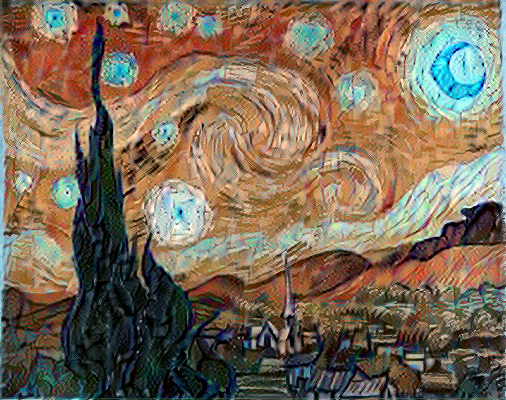

----completed in 15.069065570831299 seconds


----iteration 1


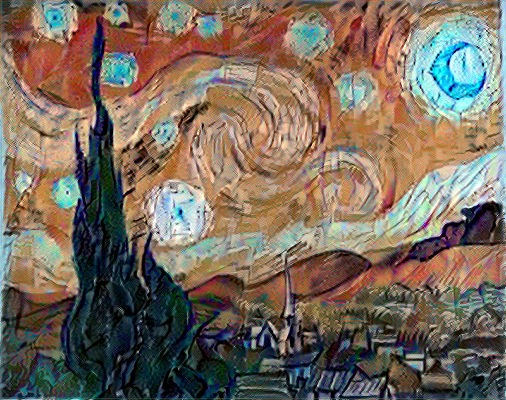

----completed in 13.706127882003784 seconds


----iteration 2


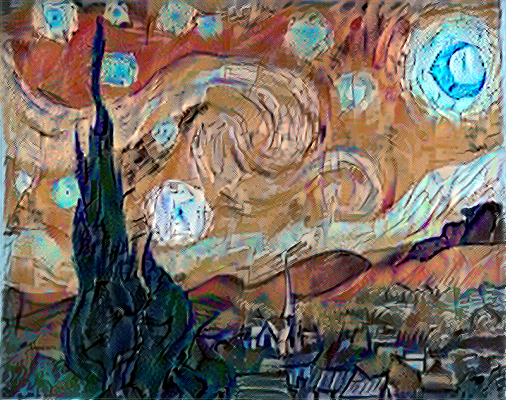

----completed in 13.64258360862732 seconds


----iteration 3


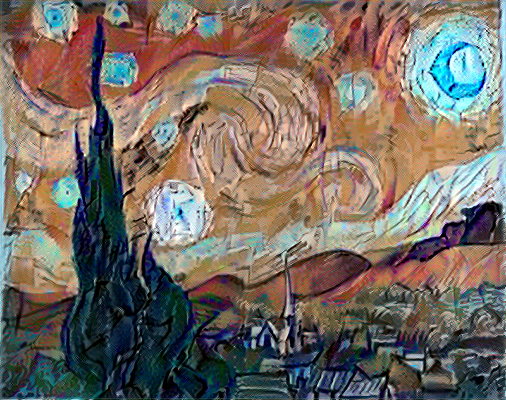

----completed in 13.573656558990479 seconds


----iteration 4


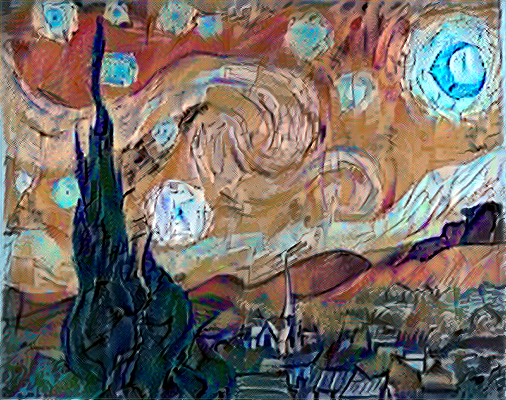

----completed in 13.656044960021973 seconds


----iteration 5


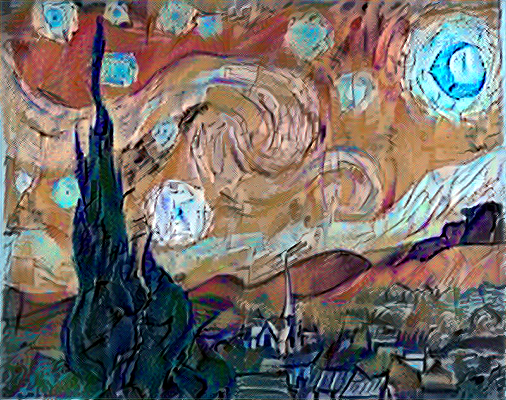

----completed in 13.667040586471558 seconds


----iteration 6


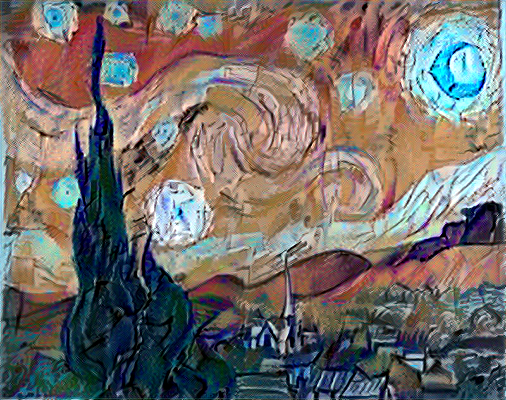

----completed in 13.759370803833008 seconds


----iteration 7


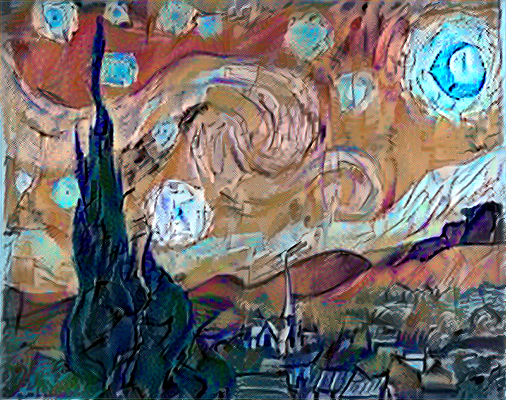

----completed in 13.685362577438354 seconds


----iteration 8


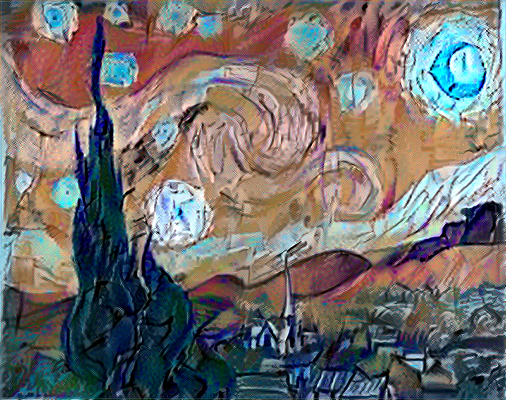

----completed in 13.752111434936523 seconds


----iteration 9


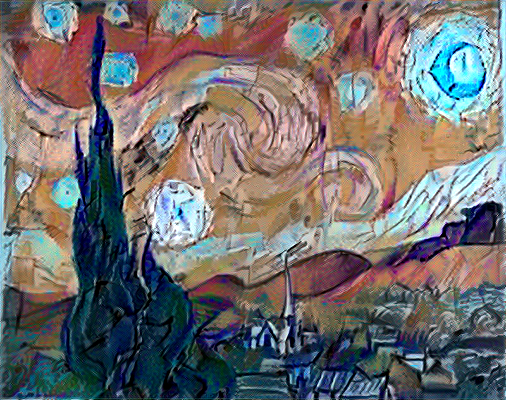

----completed in 13.750590562820435 seconds


----iteration 10


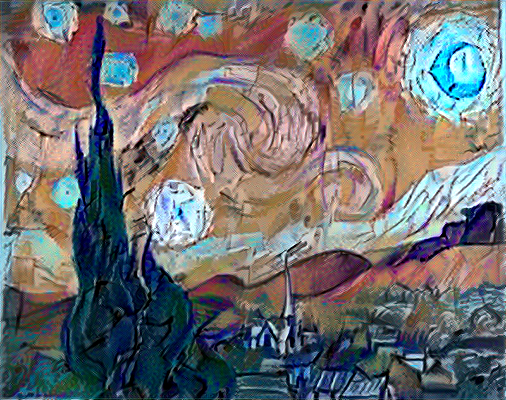

----completed in 13.720161437988281 seconds


----iteration 11


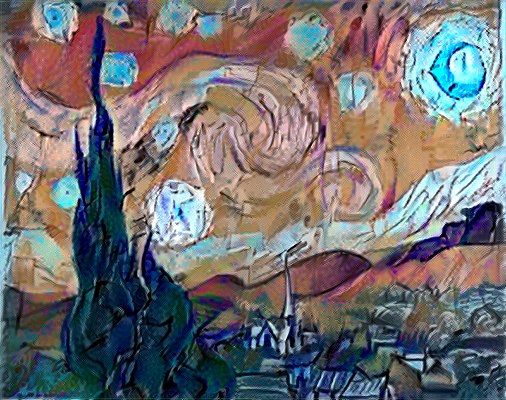

----completed in 13.675366878509521 seconds


----iteration 12


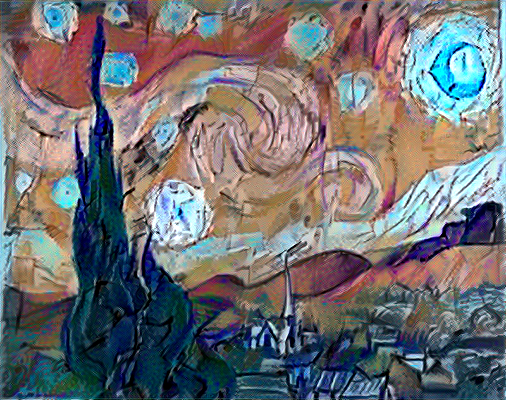

----completed in 13.865729808807373 seconds


----iteration 13


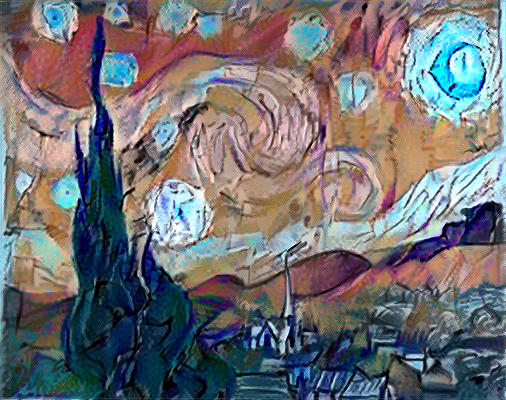

----completed in 13.733024597167969 seconds


----iteration 14


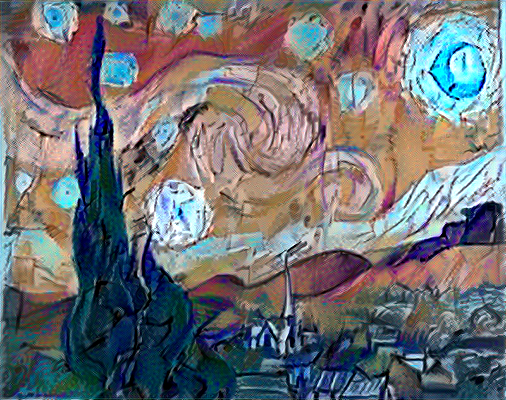

----completed in 13.713410377502441 seconds


----iteration 15


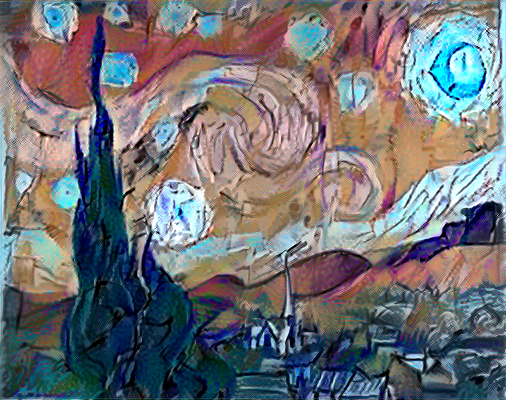

----completed in 13.696667432785034 seconds


----iteration 16


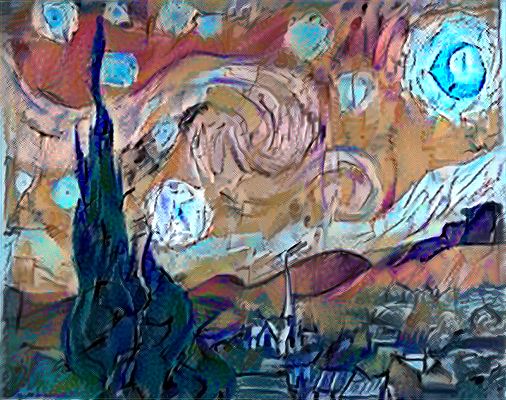

----completed in 13.662624835968018 seconds


----iteration 17


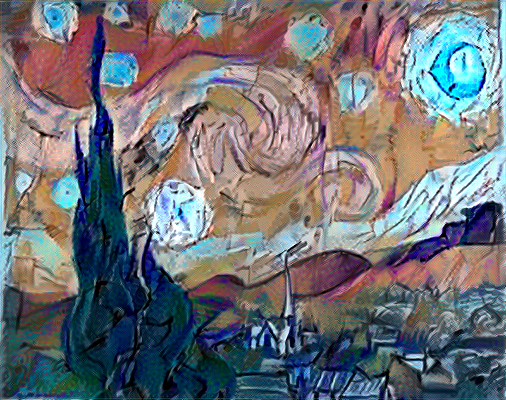

----completed in 13.786184310913086 seconds


----iteration 18


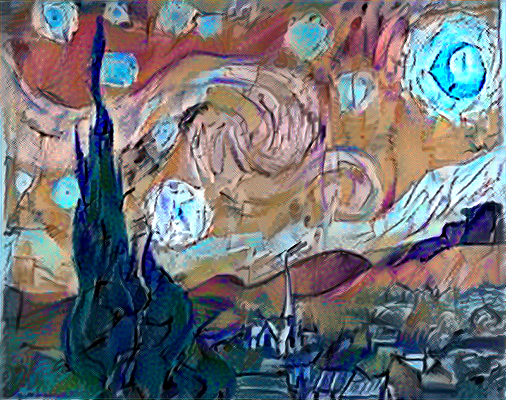

----completed in 13.746537446975708 seconds


----iteration 19


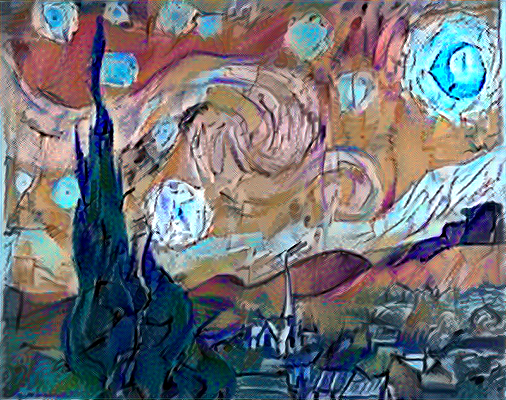

----completed in 13.706047534942627 seconds
---------STOP STYLING---------


True

In [ ]:
from scipy.optimize import fmin_l_bfgs_b
from google.colab.patches import cv2_imshow
import cv2
import time

iterations = 20

print(f'---------START STYLING---------')
x = preprocess_image(target_image_path)
x = x.flatten()
for i in range(iterations):
  print(f"\n\n----iteration {i}")
  start_time = time.time()
  # выполняется оптимизация L-BFGS по пикселям, чтобы минимизировать потерю стиля
  x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x, fprime=evaluator.grads, maxfun=20)
  img = x.copy().reshape((img_height, img_width, 3))
  img = deprocess_image(img)
  cv2_imshow(img)
  end_time = time.time()
  print(f'----completed in {end_time - start_time} seconds')

print(f'---------STOP STYLING---------')
cv2.imwrite('/content/drive/MyDrive/StudyingKeras/Deep Style/output/final_style.jpg', img)